# Portfolio Optimisation with Modern Portfolio Theory

The aim of this project is to optimize a portfolio's asset allocation using Modern Portfolio Theory (MPT) by comparing three different methods: Maximum Sharpe Ratio, Minimum Volatility, and Risk Parity. The objective is to showcase the effectiveness and differences of these allocation strategies in constructing an efficient portfolio, enhancing returns while managing risk.

1. Maximum Sharpe Ratio: The Sharpe Ratio is calculated as the ratio of excess return to the portfolio's standard deviation. By maximizing this ratio, the method aims to find the portfolio that provides the highest return per unit of risk. This method assumes historical returns to estimate the expected returns and uses exponentially weighted covariance matrix as the parameters. It optimizes for the different weight combinations with the highest Sharpe ratio.

2. Minimum Volatility: The Minimum Volatility method, also known as Minimum Variance Portfolio, aims to construct a portfolio that has the lowest possible risk (volatility) for a given level of expected return. This method focuses solely on minimizing the portfolio's overall volatility without considering the expected returns of the assets.

3. Risk Parity: The Risk Parity method allocates assets in such a way that each asset contributes equally to the overall portfolio risk. This method aims to balance the risk contribution of each asset, ensuring that no single asset dominates the portfolio's risk profile. This approach is particularly useful in managing diversification and reducing concentration risk.

In the subsequent sections of this Notebook, the performance of the three portfolios are compared using several metrics such as Sharpe, Sortino, maximum drawdowns, portfolio turnover, etc., to understand the strengths and weaknesses of each allocation strategy. The goal is to provide a comprehensive analysis that highlights the practical applications of these methods in portfolio management. The backtest period starts from 2000 to 2023, with the following stocks: AAPL, KO, PG, MSFT, JPM, LLY. While this was implemented with single stocks, this analysis can be easily replicated with other asset classes.

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import copy
from datetime import date, timedelta
import statsmodels.api as sm
from scipy.stats import norm
from scipy.optimize import minimize
from scipy.optimize import fsolve
import itertools
import plotly.graph_objects as go
import yfinance as yf
import plotly.express as px
from plotly.subplots import make_subplots
import matplotlib.cm as cm
from matplotlib.colors import ListedColormap
from matplotlib import colors
import statsmodels.formula.api as smf
import port_cons as pc
from dateutil.parser import parse

/Users/Gaby/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/Gaby/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
def convert_to_datetime(input_str, parserinfo=None):
    return parse(input_str, parserinfo=parserinfo)

In [4]:
start_date = '1995-01-01'
end_date = '2023-12-31'
bt_start_date = '2000-01-01'

start_date = convert_to_datetime(start_date)
end_date = convert_to_datetime(end_date)
bt_start_date = convert_to_datetime(bt_start_date)


tickers = ['AAPL', 'KO', 'PG','MSFT', 'JPM', 'LLY']
df_price = yf.download(tickers, start=start_date, end=end_date)['Adj Close']

[*********************100%%**********************]  6 of 6 completed


In [5]:
df_price = df_price.dropna()
df_ret = df_price.pct_change().fillna(0)
df_ret

Ticker,AAPL,JPM,KO,LLY,MSFT,PG
Date,,,,,,
1995-01-03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1995-01-04,0.026060,0.017242,-0.021739,-0.001916,0.007269,-0.008017
1995-01-05,-0.012700,0.010170,-0.004938,0.003839,-0.016495,-0.014141
1995-01-06,0.080386,0.003355,0.000000,-0.003824,0.016771,0.002049
1995-01-09,-0.018974,0.006688,-0.014889,-0.005758,-0.006185,-0.004090
...,...,...,...,...,...,...
2023-12-22,-0.005547,-0.000597,0.005691,-0.002815,0.002784,0.007071
2023-12-26,-0.002841,0.005914,0.004115,0.000491,0.000214,0.004543
2023-12-27,0.000518,0.005998,0.002561,0.018995,-0.001575,0.000822


## Constituent performance

In [6]:
pc.performance_summary_constituents(df_ret, start_date=start_date, end_date=end_date, frequency='daily')

,AAPL,JPM,KO,LLY,MSFT,PG
Cumulative return,66944.94%,3123.14%,836.47%,7684.05%,16024.31%,1821.48%
Annualized return,26.20%,13.22%,8.33%,16.85%,19.93%,11.15%
1y cumulative return,35.19%,31.30%,-5.00%,61.94%,47.49%,-1.69%
3y cumulative return,64.11%,59.54%,21.21%,329.01%,80.52%,11.27%
5y cumulative return,264.91%,86.12%,51.03%,466.85%,262.78%,92.05%
8y cumulative return,636.75%,244.27%,101.16%,738.71%,889.78%,171.88%
3y ann. return,17.95%,16.85%,6.62%,62.49%,21.76%,3.62%
5y ann. return,29.55%,13.23%,8.60%,41.48%,29.40%,13.94%
8y ann. return,28.36%,16.71%,9.13%,30.45%,33.18%,13.32%
Annualized volatility,43.47%,37.91%,22.27%,28.80%,31.93%,22.43%


# Portfolio 1: Max sharpe

In [31]:
max_wgt_constraint = 0.3

constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1}, # sum up to 1
               # {'type': 'ineq', 'fun': lambda weights: max_wgt_constraint - weights}, # Weights should be <= 1
               {'type': 'ineq', 'fun': lambda weights: weights}) 

Max_Sharpe_wgt = pc.max_sharpe_rebal_wgt(df_ret, start_date=bt_start_date, end_date=end_date, constraints_dict=constraints, 
                        shrink_covar=False, rebal_months=[1], annualized=261, halflife=3.5)

Max_Sharpe_perf = pc.calc_port_perf(df_ret.loc[bt_start_date:end_date], Max_Sharpe_wgt, name_prefix='Max_Sharpe')

Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully


In [32]:
display(pc.display_rebal_wgt(Max_Sharpe_wgt))

,reb_flag,AAPL_wgt,JPM_wgt,KO_wgt,LLY_wgt,MSFT_wgt,PG_wgt
Date,,,,,,,
2000-01-03 00:00:00,100.00%,2.98%,9.19%,0.00%,11.45%,49.68%,26.70%
2001-01-02 00:00:00,100.00%,0.00%,17.37%,8.76%,30.13%,27.05%,16.69%
2002-01-02 00:00:00,100.00%,0.66%,10.73%,0.65%,31.76%,33.70%,22.50%
2003-01-02 00:00:00,100.00%,0.00%,0.98%,0.00%,29.97%,35.09%,33.97%
2004-01-02 00:00:00,100.00%,0.35%,6.13%,0.84%,27.08%,29.67%,35.92%
2005-01-03 00:00:00,100.00%,8.63%,6.18%,0.00%,19.25%,26.53%,39.41%
2006-01-03 00:00:00,100.00%,13.66%,5.90%,0.00%,18.48%,23.26%,38.70%
2007-01-03 00:00:00,100.00%,12.86%,8.87%,0.00%,15.40%,23.18%,39.69%
2008-01-02 00:00:00,100.00%,16.87%,1.92%,4.30%,13.53%,22.81%,40.57%


None

# Portfolio 2: Min volatility

In [33]:
max_wgt_constraint = 0.3

constraints = ({'type': 'eq', 'fun': lambda weights: np.sum(weights) - 1}, # sum up to 1
               # {'type': 'ineq', 'fun': lambda weights: max_wgt_constraint - weights}, # Weights should be <= 1
               {'type': 'ineq', 'fun': lambda weights: weights}) 

Min_Vol_wgt = pc.min_vol_rebal_wgt(df_ret, start_date=bt_start_date, end_date=end_date, constraints_dict=constraints, 
                     shrink_covar=False, rebal_months=[1], annualized=261, halflife=3.5)

Min_Vol_perf = pc.calc_port_perf(df_ret.loc[bt_start_date:end_date], Min_Vol_wgt, name_prefix='Min_Vol')

Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully


In [34]:
display(pc.display_rebal_wgt(Min_Vol_wgt))

,reb_flag,AAPL_wgt,JPM_wgt,KO_wgt,LLY_wgt,MSFT_wgt,PG_wgt
Date,,,,,,,
2000-01-03 00:00:00,100.00%,6.41%,9.19%,27.29%,12.33%,14.06%,30.71%
2001-01-02 00:00:00,100.00%,5.81%,13.86%,26.57%,14.68%,15.63%,23.44%
2002-01-02 00:00:00,100.00%,4.82%,12.13%,27.09%,17.98%,13.43%,24.54%
2003-01-02 00:00:00,100.00%,5.36%,6.05%,28.82%,17.82%,12.33%,29.62%
2004-01-02 00:00:00,100.00%,5.12%,5.09%,28.77%,16.66%,12.09%,32.26%
2005-01-03 00:00:00,100.00%,4.48%,5.77%,28.28%,15.56%,12.89%,33.02%
2006-01-03 00:00:00,100.00%,3.71%,6.17%,29.08%,15.37%,13.38%,32.28%
2007-01-03 00:00:00,100.00%,3.24%,6.24%,30.13%,15.37%,13.12%,31.90%
2008-01-02 00:00:00,100.00%,2.98%,4.14%,31.54%,15.42%,12.86%,33.05%


None

# Portfolio 3: Risk Parity

In [35]:
TOLERANCE = 1e-10

def _allocation_risk(weights, covariances):

    portfolio_risk = np.sqrt((weights * covariances * weights.T))[0, 0]

    return portfolio_risk

def _assets_risk_contribution_to_allocation_risk(weights, covariances):

    portfolio_risk = _allocation_risk(weights, covariances)

    assets_risk_contribution = np.multiply(weights.T, covariances * weights.T) \
        / portfolio_risk

    return assets_risk_contribution

def _risk_budget_objective_error(weights, args):
    covariances = args[0]
    assets_risk_budget = args[1]
    weights = np.matrix(weights)

    portfolio_risk = _allocation_risk(weights, covariances)

    assets_risk_contribution = \
        _assets_risk_contribution_to_allocation_risk(weights, covariances)

    assets_risk_target = \
        np.asmatrix(np.multiply(portfolio_risk, assets_risk_budget))

    error = sum(np.absolute(assets_risk_contribution - assets_risk_target.T))[0, 0]
    return error

def _get_risk_parity_weights(covariances, assets_risk_budget, initial_weights):

    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1.0},{'type': 'ineq', 'fun': lambda x: x})

    optimize_result = minimize(fun=_risk_budget_objective_error,
                               x0=initial_weights,
                               args=[covariances, assets_risk_budget],
                               method='SLSQP',
                               constraints=constraints,
                               tol=TOLERANCE,
                               options={'disp': False})

    weights = optimize_result.x
    print(optimize_result.message)
    return weights

def rebal_wgt_riskparity(returns_data, start_date, end_date, rebal_months=[4,10], halflife=3.5, annualized=252, shrink_covar=False):
    num_of_assets = len(returns_data.columns)
    
    ret_data_filtered = returns_data.loc[start_date:end_date]
    first_date = returns_data.index[0]
    tickers = list(returns_data.columns)

    weights = pd.DataFrame(0, index=ret_data_filtered.index, columns=ret_data_filtered.columns)
    weights.index = pd.to_datetime(weights.index, format='%Y-%m-%d')
    reb_flag = pd.DataFrame(0, index=weights.index, columns=['reb_flag'])

    alpha = 1 - math.exp(math.log(0.5) / (halflife * annualized))
    span = (2 / alpha) - 1
    
    for i in range(len(ret_data_filtered)):
        curr_date = ret_data_filtered.index[i]
        curr_date_format = curr_date.strftime('%Y-%m-%d')

        if (weights.index[i].month in rebal_months and weights.index[i-1].month != weights.index[i].month) or i==0:
            
            if shrink_covar:
                shrink_covar_matrix_model = LedoitWolf().fit(returns_data.loc[first_date:curr_date])
                covar_ann = pd.DataFrame(shrink_covar_matrix_model.covariance_ * annualized, index=tickers, columns=tickers)
                covar_ann.columns = tickers
                covar_ann.index = tickers
            else:
                exp_cov_matrix = returns_data.loc[first_date:curr_date].ewm(span=span).cov(pairwise=True).iloc[-num_of_assets:]
                covar_ann = exp_cov_matrix * annualized
                covar_ann.columns = tickers
                covar_ann.index = tickers
            
            valid_covar_ann = covar_ann.dropna(how='all')
            valid_covar_ann = valid_covar_ann.dropna(axis=1, how='all')
            valid_num_assets = len(valid_covar_ann)
            valid_tickers = valid_covar_ann.columns
            
            assets_risk_budget = np.ones([valid_num_assets]) / valid_num_assets
            initial_weights = np.ones([valid_num_assets]) / valid_num_assets
            
            # print(valid_covar_ann)
            new_wgt = _get_risk_parity_weights(valid_covar_ann.values, assets_risk_budget, initial_weights)
            new_wgt = pd.DataFrame(new_wgt).T
            new_wgt.columns = valid_tickers

            for ticker in valid_tickers:
                weights.at[curr_date_format, ticker] = new_wgt[ticker].values
                
            reb_flag.loc[curr_date_format] = True

        else:
            weights.iloc[i] = weights.iloc[i-1] * (1+ ret_data_filtered.iloc[i].fillna(0))
            weights_sum = weights.iloc[i].sum()
            weights.iloc[i] /= weights_sum
            reb_flag.iloc[i] = False
    
    weights = weights.rename(columns={c: c + '_wgt' for c in weights.columns})
    weights = pd.concat([reb_flag, weights], axis=1)
    
    return weights

In [36]:
Risk_Parity_wgt = rebal_wgt_riskparity(df_ret, start_date=bt_start_date, end_date=end_date,rebal_months=[1],
                                       halflife=3.5, annualized=261, shrink_covar=False)

Risk_Parity_perf = pc.calc_port_perf(df_ret.loc[bt_start_date:end_date], Risk_Parity_wgt, name_prefix='Risk_Parity')

Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully
Optimization terminated successfully


In [37]:
display(pc.display_rebal_wgt(Risk_Parity_wgt))

,reb_flag,AAPL_wgt,JPM_wgt,KO_wgt,LLY_wgt,MSFT_wgt,PG_wgt
Date,,,,,,,
2000-01-03 00:00:00,100.00%,12.15%,15.36%,19.84%,16.48%,15.70%,20.47%
2001-01-02 00:00:00,100.00%,11.45%,16.10%,20.04%,16.97%,15.80%,19.63%
2002-01-02 00:00:00,100.00%,10.92%,15.35%,20.40%,18.24%,14.83%,20.26%
2003-01-02 00:00:00,100.00%,11.37%,13.53%,20.95%,18.08%,14.33%,21.76%
2004-01-02 00:00:00,100.00%,11.37%,13.37%,20.97%,17.70%,14.24%,22.36%
2005-01-03 00:00:00,100.00%,11.16%,13.65%,20.82%,17.41%,14.53%,22.42%
2006-01-03 00:00:00,100.00%,10.85%,13.87%,20.96%,17.40%,14.75%,22.17%
2007-01-03 00:00:00,100.00%,10.61%,13.95%,21.15%,17.44%,14.81%,22.04%
2008-01-02 00:00:00,100.00%,10.56%,13.56%,21.37%,17.47%,14.77%,22.27%


None

# Benchmark

In [38]:
bm_tickers = ['SPY']
df_bm = yf.download(bm_tickers, start=bt_start_date, end=end_date)['Adj Close']
ret_bm = pd.DataFrame(df_bm.pct_change())
ret_bm.columns = bm_tickers

[*********************100%%**********************]  1 of 1 completed


# Portfolio Comparison

In [39]:
def combine_backtest_data(portfolio_names):
    # combined portfolio returns
    all_port_ret = {}

    for portfolio in portfolio_names:
        perf_df = globals()[f"{portfolio}_perf"]
        ret_col = [col for col in perf_df.columns if col.endswith('_port_ret')]
        all_port_ret[portfolio] = perf_df[ret_col]

    df_all_port_ret = pd.concat(all_port_ret.values(), keys=all_port_ret.keys(), axis=1)
    df_all_port_ret.columns = [col[0] for col in df_all_port_ret.columns]

    # combined portfolio weights
    all_port_weights = {}

    for portfolio in portfolio_names:
        wgt_df = globals()[f"{portfolio}_wgt"]
        # wgt_col = [col for col in wgt_df.columns if col.endswith('_wgt')]
        # all_port_weights[portfolio] = wgt_df[wgt_col]
        all_port_weights[portfolio] = wgt_df

    df_all_port_weights = pd.concat(all_port_weights.values(), keys=all_port_weights.keys(), axis=1)

    # combined portfolio backtest daata
    all_port_bt = {}

    for portfolio in portfolio_names:
        bt_df = globals()[f"{portfolio}_perf"]
        all_port_bt[portfolio] = bt_df

    df_all_port_bt = pd.concat(all_port_bt.values(), keys=all_port_bt.keys(), axis=1)
    return df_all_port_ret, df_all_port_weights, df_all_port_bt

In [40]:
port_names = ['Max_Sharpe', 'Min_Vol', 'Risk_Parity']

all_port_ret, all_port_wgt, all_port_bt = combine_backtest_data(port_names)
all_port_ret = pd.concat([all_port_ret, ret_bm], axis=1).loc[bt_start_date:]

In [41]:
perf_summary = pc.performance_summary(all_port_ret[port_names], all_port_wgt, all_port_ret['SPY'], benchmark_returns=ret_bm, 
                                    start_date=bt_start_date, end_date=end_date, frequency='daily', rebal_per_year=1).T

relative_perf = pc.calculate_relative_per(all_port_ret[port_names], ret_bm['SPY'])
df_ports_alloc_avg = pc.compare_port_alloc(all_port_wgt, port_names, latest_data=False)

port_turnover_df = pd.DataFrame()

for portfolio in port_names:
    turnover = pc.portfolio_turnover(all_port_wgt[portfolio])
    port_turnover_df = pd.concat([port_turnover_df, turnover],axis=1)
    
port_turnover_df.columns = port_names

compare_port_ret_attr = pc.compare_port_ret_attr(all_port_wgt, df_ret.loc[bt_start_date:], portfolio_names=port_names)

In [47]:
def generate_key_data():
    print('-' * 30, 'KEY SUMMARY', '-' * 30)
    display(perf_summary)
    
    print('-' * 30, 'RELATIVE YEARLY RETURNS', '-' * 30)
    display(pc.apply_style_heatmap_ret(relative_perf, subset=relative_perf.columns[1:]))
    
    print('-' * 30, 'CUMULATIVE RETURNS', '-' * 30)
    pc.plot_cumulative_returns(all_port_ret, show_data=True)

    print('-' * 30, 'RETURNS DISTRIBUTION', '-' * 30)
    pc.plot_returns_distribution_boxplot(all_port_ret)

    print('-' * 30, 'AVERAGE ALLOCATION', '-' * 30)
    display(df_ports_alloc_avg.pipe(pc.apply_style_heatmap).pipe(pc.apply_2dp_percentage))
    
    print('-' * 30, 'PORTFOLIO ALLOCATION', '-' * 30)
    for port in port_names:
        print(port)
        pc.plot_weights_and_turnover(all_port_wgt[port], show_data=True, show_turnover=True, show_rebal=False)
        
    print('-' * 30, 'PORTFOLIO DRAWDOWN', '-' * 30)        
    pc.plot_drawdowns(all_port_ret, show_data=True)

    print('-' * 30, 'CORRELATION', '-' * 30)        
    pc.plot_correlation_heatmap(all_port_ret)
    
    # print('-' * 30, 'RETURN ATTRIBUTION', '-' * 30)        
    # display(compare_port_ret_attr.pipe(pc.apply_style_heatmap_ret))

# KEY DATA

------------------------------ KEY SUMMARY ------------------------------


,SPY,Max_Sharpe,Min_Vol,Risk_Parity
Cumulative return,406.28%,1414.93%,744.70%,1809.30%
Annualized return,7.26%,12.47%,9.66%,13.60%
1y cumulative return,21.37%,33.36%,9.31%,25.78%
3y cumulative return,38.38%,81.41%,49.87%,79.00%
5y cumulative return,88.64%,234.63%,127.90%,184.81%
8y cumulative return,182.33%,500.79%,237.98%,383.63%
3y ann. return,11.44%,21.96%,14.44%,21.42%
5y ann. return,13.53%,27.32%,17.91%,23.28%
8y ann. return,13.85%,25.12%,16.44%,21.78%
Annualized volatility,19.97%,20.22%,17.43%,18.98%


------------------------------ RELATIVE YEARLY RETURNS ------------------------------


,Benchmark_absolute_ret,Max_Sharpe,Min_Vol,Risk_Parity
2000,-8.85%,-26.68%,-4.88%,-6.66%
2001,-11.76%,17.38%,13.28%,16.26%
2002,-21.58%,7.64%,11.72%,8.26%
2003,28.18%,-14.59%,-7.93%,-3.55%
2004,10.70%,-6.97%,-2.26%,11.24%
2005,4.83%,9.52%,3.43%,11.40%
2006,15.85%,-3.90%,-1.09%,-0.81%
2007,5.15%,23.90%,16.88%,22.41%
2008,-36.79%,7.00%,12.91%,8.90%
2009,26.35%,15.58%,-6.18%,8.58%


------------------------------ CUMULATIVE RETURNS ------------------------------


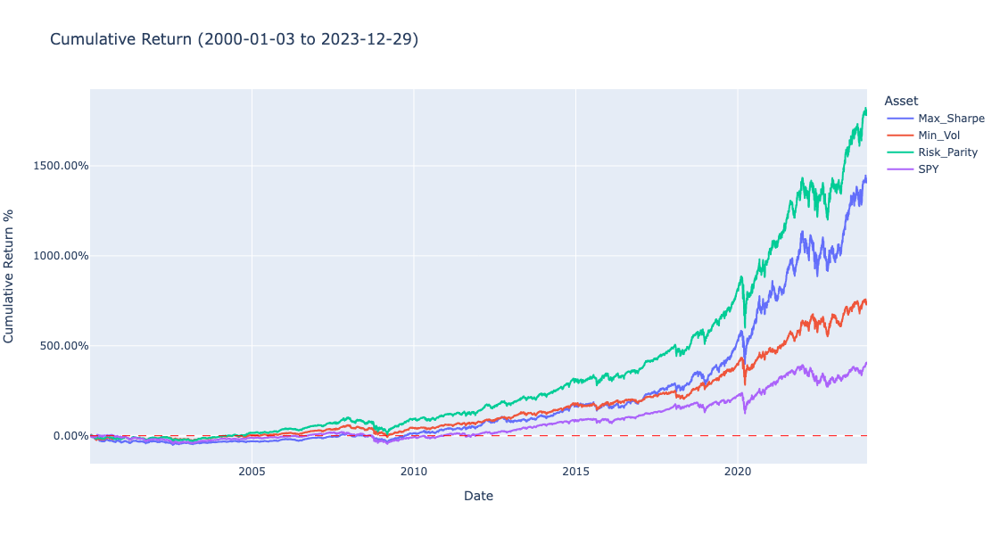

------------------------------ RETURNS DISTRIBUTION ------------------------------


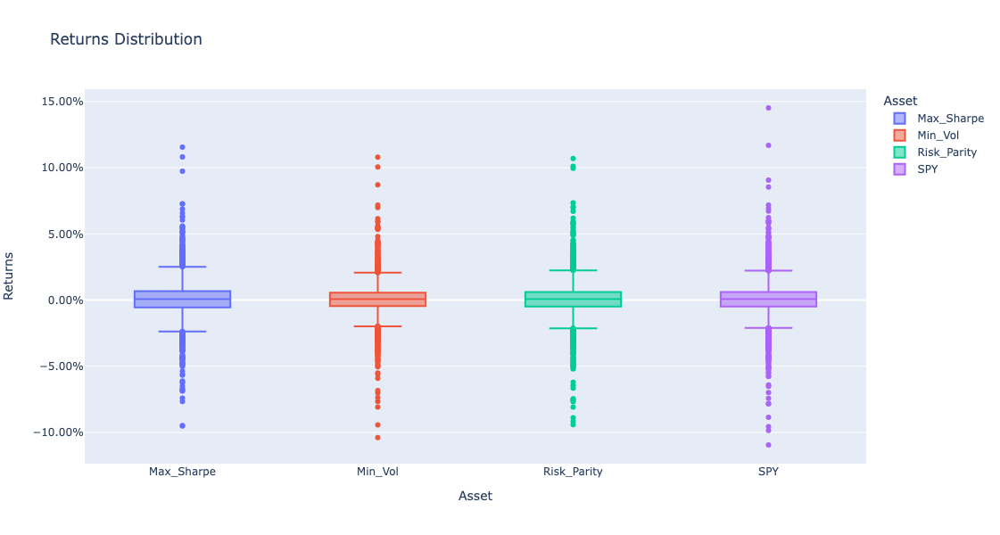

------------------------------ AVERAGE ALLOCATION ------------------------------


,Max_Sharpe,Min_Vol,Risk_Parity
PG_wgt,34.01%,35.32%,21.11%
AAPL_wgt,27.37%,5.95%,13.72%
MSFT_wgt,18.01%,7.88%,14.53%
LLY_wgt,15.11%,14.71%,17.71%
JPM_wgt,3.30%,3.03%,12.17%
KO_wgt,2.19%,33.12%,20.76%


------------------------------ PORTFOLIO ALLOCATION ------------------------------
Max_Sharpe


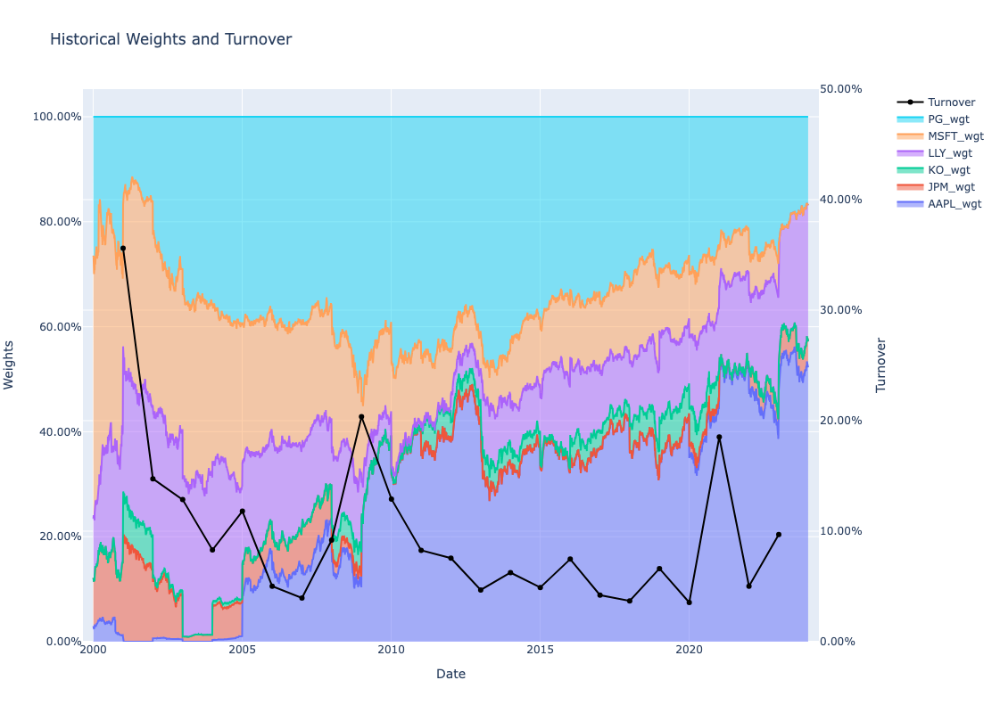

Min_Vol


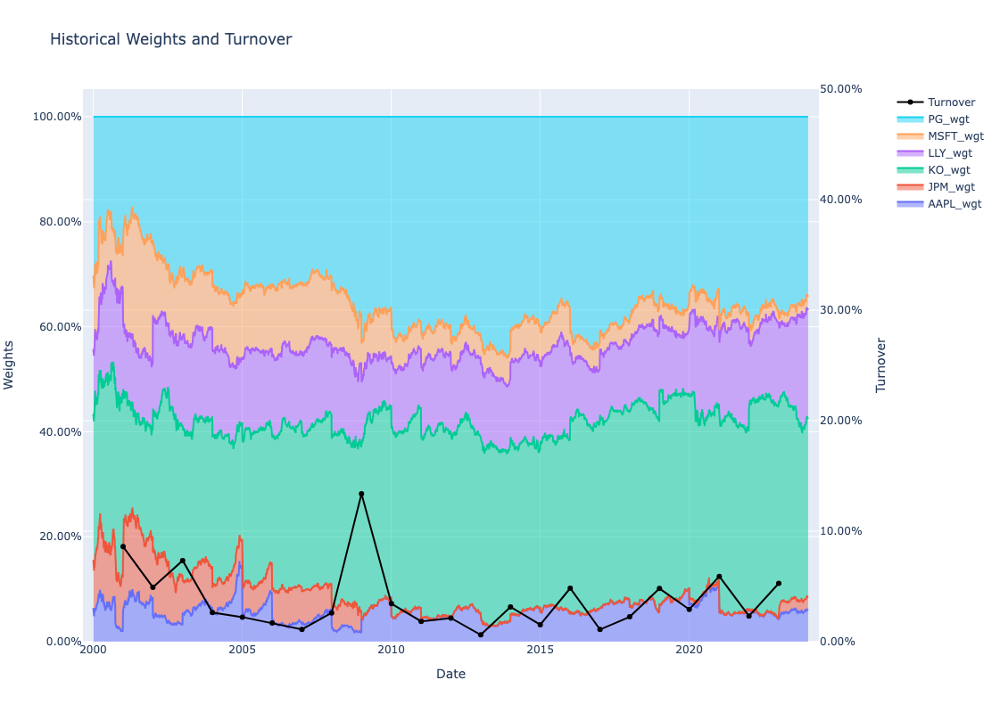

Risk_Parity


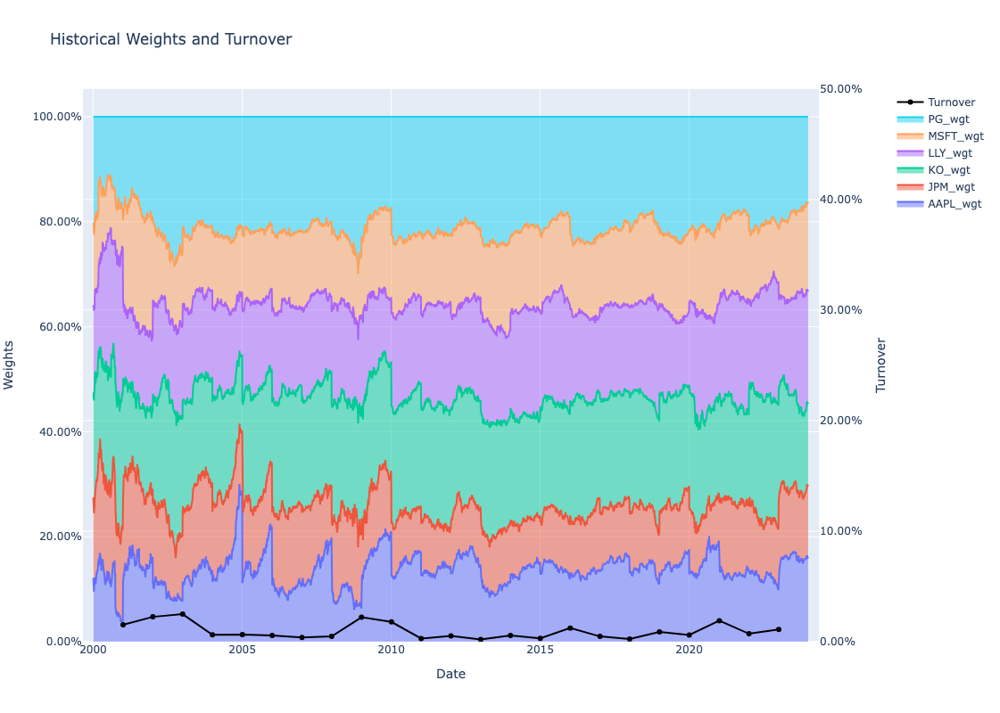

------------------------------ PORTFOLIO DRAWDOWN ------------------------------


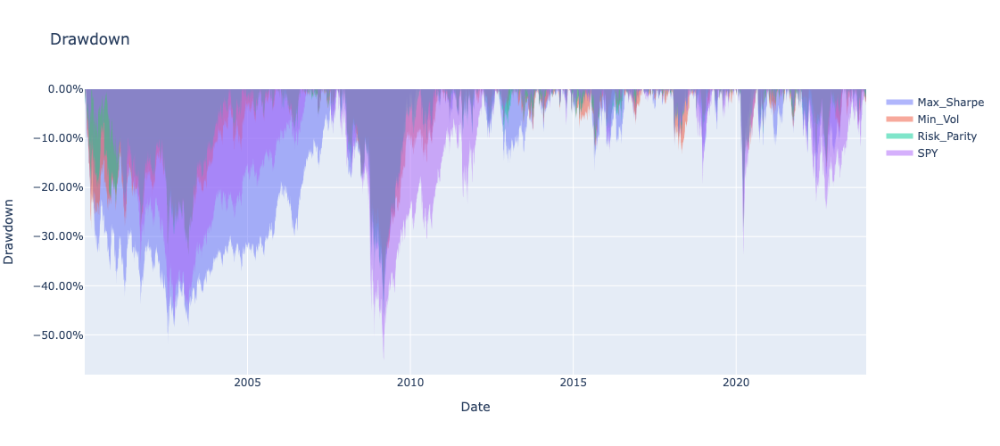

------------------------------ CORRELATION ------------------------------


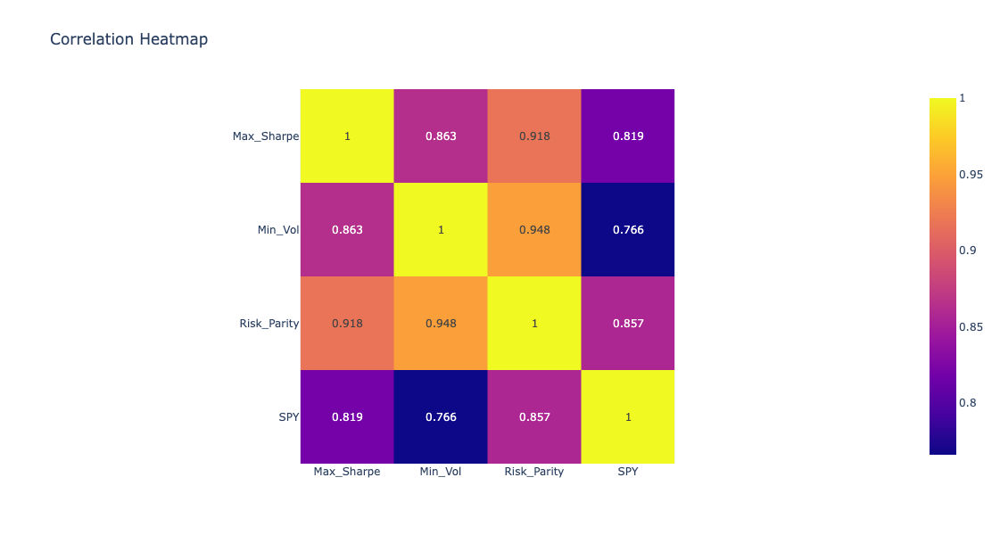

In [48]:
generate_key_data()